In [1]:
!pip install tweepy requests pandas


In [2]:
!pip install imbalanced-learn


In [3]:
import pandas as pd
import os
import tweepy
from datetime import datetime
from sklearn.feature_extraction.text import TfidfVectorizer
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
import re
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')
nltk.download('stopwords')
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.api import VAR
import numpy as np

from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:

# 1. Fantasy Premier League Tweets
fpl_df = pd.read_csv("FPL_tweets.csv")

# 3. Twitter Sentiment Dataset
sentiment140_df = pd.read_csv("/content/twitter_sentiment_dataset.csv")

# 4. Stock-related Tweets
stock_df = pd.read_csv("/content/stock_tweets.csv")

# 5. MVSA Stock Dataset (possibly stock price data)
mvsa_df = pd.read_csv("/content/stock_yfinance_data.csv")

# 6. Disaster-related Tweets Dataset
daniel_df = pd.read_csv("/content/disasters.csv")

# 7. AI-Generated Fake Tweet Dataset (JSON format)
fake_df = pd.read_json('/content/fake_ai_sentiment_tweets.json')

# Check if all files loaded correctly
print(" All datasets loaded successfully.")
print(f"FPL shape: {fpl_df.shape}")
print(f"Sentiment140 shape: {sentiment140_df.shape}")
print(f"Stock shape: {stock_df.shape}")
print(f"MVSA shape: {mvsa_df.shape}")
print(f"Daniel Disaster shape: {daniel_df.shape}")
print(f"Fake shape: {fake_df.shape}")


 All datasets loaded successfully.
FPL shape: (114466, 13)
Sentiment140 shape: (2000, 8)
Stock shape: (80793, 4)
MVSA shape: (6300, 8)
Daniel Disaster shape: (4913, 17)
Fake shape: (200, 4)


Dataset 1 shape: (114466, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                  timestamp  \
0 2012-12-30 23:56:11+00:00   

                                                text sentiment  
0  I scored 75 points in Gameweek 20 on Fantasy P...   neutral  
Dataset 2 shape: (2000, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                         timestamp  \
0 2022-11-07 18:49:55.793691+00:00   

                                                text sentiment  
0  Talk get bag focus pattern necessary. Step com...       NaN  
Dataset 3 shape: (80793, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                  timestamp  \
0 2022-09-29 23:41:16+00:00   

                                                text sentiment  
0  Mainstream media has done an amazing job at br...   neutral  
Dataset 4 shape: (6300, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                  timestamp  text sentiment
0 2021-09-30 00:00:0

In [5]:

# 1. FPL Tweets Dataset
fpl_df = pd.read_csv("/content/FPL_tweets.csv")
print("FPL Columns:", fpl_df.columns)
fpl_df['timestamp'] = pd.to_datetime(fpl_df['Timestamp'], errors='coerce')
fpl_df['sentiment'] = 'neutral'  # No sentiment info
fpl_df = fpl_df.rename(columns={'Text': 'text'})
fpl_df = fpl_df[['timestamp', 'text', 'sentiment']]


# 3. Sentiment140 Dataset
sentiment140_df = pd.read_csv("/content/twitter_sentiment_dataset.csv", encoding='latin-1')
print("Sentiment140 Columns:", sentiment140_df.columns)
sentiment140_df = sentiment140_df.rename(columns={'Tweet Text': 'text', 'Timestamp': 'timestamp', 'Sentiment': 'sentiment'})
sentiment140_df['timestamp'] = pd.to_datetime(sentiment140_df['timestamp'], errors='coerce')
sentiment140_df['sentiment'] = sentiment140_df['sentiment'].map({0: 'negative', 1: 'positive'})
sentiment140_df = sentiment140_df[['timestamp', 'text', 'sentiment']]

# 4. Stock Tweets Dataset
stock_df = pd.read_csv("/content/stock_tweets.csv")
print("Stock Tweets Columns:", stock_df.columns)
stock_df['timestamp'] = pd.to_datetime(stock_df['Date'], errors='coerce')
stock_df = stock_df.rename(columns={'Tweet': 'text'})
stock_df['sentiment'] = 'neutral'
stock_df = stock_df[['timestamp', 'text', 'sentiment']]

# 5. MVSA Dataset
mvsa_df = pd.read_csv("/content/stock_yfinance_data.csv", encoding='latin-1')
print("MVSA Columns:", mvsa_df.columns)
mvsa_df['timestamp'] = pd.to_datetime(mvsa_df['Date'], errors='coerce')
mvsa_df = mvsa_df.rename(columns={'Stock Name': 'text'})
mvsa_df['sentiment'] = 'neutral'
mvsa_df = mvsa_df[['timestamp', 'text', 'sentiment']]

# 6. Daniel Disaster Dataset
daniel_df = pd.read_csv("/content/disasters.csv", encoding='latin-1')
print("Daniel Columns:", daniel_df.columns)
daniel_df['timestamp'] = pd.to_datetime(daniel_df['start_date'], errors='coerce')
daniel_df = daniel_df.rename(columns={'Disaster Subtype': 'text'})
daniel_df['sentiment'] = daniel_df['Total Deaths'].apply(lambda x: 'negative' if x > 0 else 'neutral')
daniel_df = daniel_df[['timestamp', 'text', 'sentiment']]

# 7. Fake AI-Generated Tweets Dataset (JSON)
fake_df = pd.read_json('/content/fake_ai_sentiment_tweets.json')
print("Fake JSON Columns:", fake_df.columns)
fake_df['timestamp'] = pd.to_datetime(fake_df['timestamp'], errors='coerce')  # Assuming timestamp field exists
fake_df = fake_df.rename(columns={'tweet': 'text'}) if 'tweet' in fake_df.columns else fake_df
fake_df = fake_df[['timestamp', 'text', 'sentiment']]

#  Output sanity check
print(f"FPL: {fpl_df.shape}, Sentiment140: {sentiment140_df.shape}")
print(f"Stock: {stock_df.shape}, MVSA: {mvsa_df.shape}, Daniel: {daniel_df.shape}, Fake: {fake_df.shape}")


FPL Columns: Index(['ID', 'Timestamp', 'User', 'Text', 'Hashtag', 'Retweets', 'Likes',
       'Replies', 'Source', 'Location', 'Verified_Account', 'Followers',
       'Following'],
      dtype='object')
Sentiment140 Columns: Index(['Tweet ID', 'Username', 'Tweet Text', 'Retweets', 'Favorites',
       'Followers', 'Timestamp', 'Sentiment'],
      dtype='object')
Stock Tweets Columns: Index(['Date', 'Tweet', 'Stock Name', 'Company Name'], dtype='object')
MVSA Columns: Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Stock Name'],
      dtype='object')
Daniel Columns: Index(['Disaster Type', 'Disaster Subtype', 'Disaster Group',
       'Disaster Subgroup', 'Event Name', 'Origin', 'Country', 'Location',
       'Latitude', 'Longitude', 'start_date', 'end_date', 'Total Deaths',
       'No Affected', 'Reconstruction Costs ('000 US$)',
       'Total Damages ('000 US$)', 'CPI'],
      dtype='object')
Fake JSON Columns: Index(['id', 'timestamp', 'text', 'sentiment'],

In [6]:
# Twitter API Auth
BEARER_TOKEN = "AAAAAAAAAAAAAAAAAAAAAJ060wEAAAAAClvo3gj%2FWUiWwMdbweSeCy6Nj0s%3DqnORLbJeh234TpKWppefA1G7dZJ2W35H7fHvAJScwx6JFEdmEH"

client = tweepy.Client(bearer_token=BEARER_TOKEN)

# Query parameters
query = "AI OR artificial intelligence -is:retweet lang:en"
try:
    response = client.search_recent_tweets(
        query=query,
        tweet_fields=['created_at', 'author_id', 'public_metrics', 'text', 'lang', 'source'],
        user_fields=['username', 'location', 'verified', 'public_metrics'],
        expansions='author_id',
        max_results=20
    )

    tweets = response.data or []
    users = {user.id: user for user in response.includes['users']} if response.includes else {}

    tweet_data = []
    for tweet in tweets:
        user = users.get(tweet.author_id, {})
        metrics = tweet.public_metrics or {}
        user_metrics = user.public_metrics if user else {}

        tweet_data.append({
            "timestamp": tweet.created_at,
            "text": tweet.text,
            "sentiment": "neutral",  # Placeholder
        })

    twitter_df = pd.DataFrame(tweet_data)
    twitter_df['timestamp'] = pd.to_datetime(twitter_df['timestamp'], utc=True)

except Exception as e:
    print(f"Error fetching tweets: {e}")
    twitter_df = pd.DataFrame(columns=['timestamp', 'text', 'sentiment'])

# Add fake dataset
fake_df = pd.read_json('/content/fake_ai_sentiment_tweets.json')
fake_df = fake_df[['timestamp', 'text', 'sentiment']]
fake_df['timestamp'] = pd.to_datetime(fake_df['timestamp'], utc=True)

# Standardize function
def standardize_columns(df):
    text_col = next((col for col in ['Text', 'text', 'Tweet', 'content'] if col in df.columns), None)
    time_col = next((col for col in ['Timestamp', 'timestamp', 'date', 'created_at'] if col in df.columns), None)

    if not text_col or not time_col:
        raise ValueError(f"Missing required columns in dataframe: {df.columns.tolist()}")

    df = df.rename(columns={text_col: 'text', time_col: 'timestamp'})
    df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce', utc=True)

    if 'sentiment' not in df.columns:
        df['sentiment'] = 'neutral'

    return df[['timestamp', 'text', 'sentiment']]

# Apply to all
fpl_df = standardize_columns(fpl_df)
sentiment140_df = standardize_columns(sentiment140_df)
stock_df = standardize_columns(stock_df)
mvsa_df = standardize_columns(mvsa_df)
daniel_df = standardize_columns(daniel_df)
twitter_df = standardize_columns(twitter_df)
fake_df = standardize_columns(fake_df)

# Merge all
all_data = pd.concat(
    [fpl_df, sentiment140_df, stock_df, mvsa_df, daniel_df, twitter_df, fake_df],
    ignore_index=True
)
all_data.drop_duplicates(inplace=True)
all_data.reset_index(drop=True, inplace=True)

# Save
merged_file = '/content/merged_social_media_data.csv'
all_data.to_csv(merged_file, index=False)
print(f" Final merged dataset saved to: {merged_file}")
print(f" Final Shape: {all_data.shape}")
print(all_data.sample(5))


Error fetching tweets: 429 Too Many Requests
Usage cap exceeded: Monthly product cap
 Final merged dataset saved to: /content/merged_social_media_data.csv
 Final Shape: (191728, 3)
                       timestamp  \
11495  2013-12-21 09:01:21+00:00   
171882 2022-02-19 16:07:42+00:00   
156131 2022-02-03 21:05:15+00:00   
10347  2013-12-28 16:45:00+00:00   
86645  2020-09-28 05:27:14+00:00   

                                                     text sentiment  
11495   #IamDdanz Fantasy Premier League Transfers 201...   neutral  
171882   CHALA BY THE HAIRS OF HIS KNUCKLE JUST SAVED TSM   neutral  
156131  Sold the $3,200 price on my $amzn shares. Took...   neutral  
10347   Fantasy Premier League This weekend IS HURTING...   neutral  
86645   @PatrickTimmons1 I can see someone in premier ...   neutral  


In [31]:
for i, d in enumerate([fpl_df, sentiment140_df, stock_df, mvsa_df, daniel_df, fake_df, twitter_df]):  # Replace with your dataset variables
    print(f"Dataset {i+1} shape: {d.shape}")
    print(d.columns)
    print(d.head(1))


Dataset 1 shape: (114466, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                  timestamp  \
0 2012-12-30 23:56:11+00:00   

                                                text sentiment  
0  I scored 75 points in Gameweek 20 on Fantasy P...   neutral  
Dataset 2 shape: (2000, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                         timestamp  \
0 2022-11-07 18:49:55.793691+00:00   

                                                text sentiment  
0  Talk get bag focus pattern necessary. Step com...       NaN  
Dataset 3 shape: (80793, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                  timestamp  \
0 2022-09-29 23:41:16+00:00   

                                                text sentiment  
0  Mainstream media has done an amazing job at br...   neutral  
Dataset 4 shape: (6300, 3)
Index(['timestamp', 'text', 'sentiment'], dtype='object')
                  timestamp  text sentiment
0 2021-09-30 00:00:0

In [32]:
# Load datasets
datasets = [fpl_df, sentiment140_df, stock_df, mvsa_df, daniel_df, fake_df]  # Replace with your actual DataFrames
cleaned_datasets = []

for df in datasets:
    # Drop rows with missing sentiments
    df = df.dropna(subset=['sentiment'])

    # Convert timestamp
    df['timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')

    # Drop rows where timestamp couldn't be parsed
    df = df.dropna(subset=['timestamp'])

    cleaned_datasets.append(df)

# Concatenate all cleaned datasets
merged_df = pd.concat(cleaned_datasets, ignore_index=True)
merged_df = merged_df.sort_values(by='timestamp')
print(f"Merged cleaned dataset shape: {merged_df.shape}")


Merged cleaned dataset shape: (206672, 3)


In [33]:
sentiment_map = {'positive': 1, 'neutral': 0, 'negative': -1}
merged_df['sentiment_score'] = merged_df['sentiment'].map(sentiment_map)


In [7]:
#Resampling

In [34]:
merged_df.set_index('timestamp', inplace=True)
daily_df = merged_df['sentiment_score'].resample('D').mean().dropna()
daily_df = daily_df.to_frame(name='sentiment_score')


In [8]:

# Load original merged dataset
merged_df = pd.read_csv("/content/merged_social_media_data.csv", parse_dates=["timestamp"])

# Drop rows with NaNs in 'text' or 'sentiment'
merged_df.dropna(subset=["text", "sentiment"], inplace=True)

# Remove rows with non-string text
merged_df = merged_df[merged_df["text"].apply(lambda x: isinstance(x, str))]

# Count before balancing
print("Before balancing:\n", merged_df["sentiment"].value_counts())

# Vectorize the text
tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(merged_df["text"])

# Encode sentiment
le = LabelEncoder()
y = le.fit_transform(merged_df["sentiment"])

# Apply SMOTE (oversample positive and negative classes)
smote = SMOTE(sampling_strategy='not majority', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Create balanced dataframe with text + sentiment
inv_label_map = dict(zip(le.transform(le.classes_), le.classes_))
resampled_sentiments = pd.Series(y_resampled).map(inv_label_map)

# Balance the text and timestamp samples
balanced_df = pd.DataFrame(columns=merged_df.columns)
for label in resampled_sentiments.unique():
    n_samples = (resampled_sentiments == label).sum()
    samples = merged_df[merged_df["sentiment"] == label]
    if len(samples) < n_samples:
        samples = resample(samples, replace=True, n_samples=n_samples, random_state=42)
    else:
        samples = samples.sample(n=n_samples, random_state=42)
    balanced_df = pd.concat([balanced_df, samples])

balanced_df = balanced_df.reset_index(drop=True)

# Add auxiliary features for later EDA
balanced_df["hashtag_count"] = balanced_df["text"].str.count(r"#\w+")
balanced_df["mention_count"] = balanced_df["text"].str.count(r"@\w+")
balanced_df["tweet_length"] = balanced_df["text"].str.len()

# Save to CSV for Plotly EDA
balanced_df.to_csv("/content/balanced_sentiment_data.csv", index=False)

print(" Balanced dataset created and saved at /content/balanced_sentiment_data.csv")
print("Final Class Distribution:\n", balanced_df["sentiment"].value_counts())


Before balancing:
 sentiment
neutral     186385
negative      2657
positive        89
Name: count, dtype: int64
 Balanced dataset created and saved at /content/balanced_sentiment_data.csv
Final Class Distribution:
 sentiment
neutral     186385
negative    186385
positive    186385
Name: count, dtype: int64


In [9]:
##====PHASE 2: EDA (Exploratory Data Analysis) + Visualization====#

In [10]:
# Step 1: Load without parsing dates just to inspect
df = pd.read_csv("/content/balanced_sentiment_data.csv")
print("Columns in file:", df.columns.tolist())


Columns in file: ['timestamp', 'text', 'sentiment', 'hashtag_count', 'mention_count', 'tweet_length']


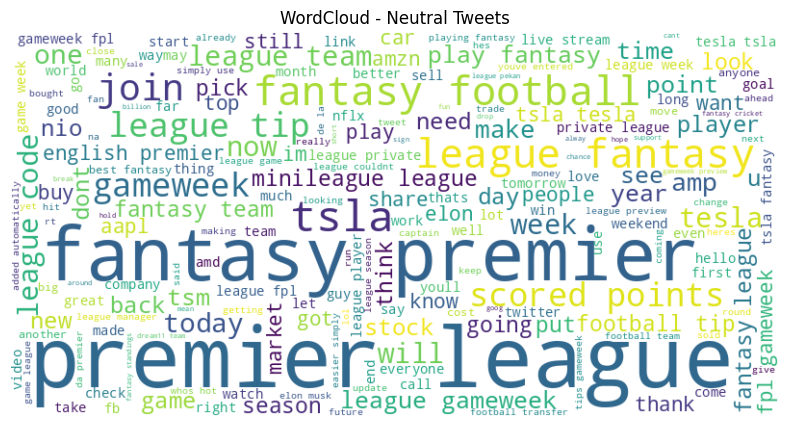

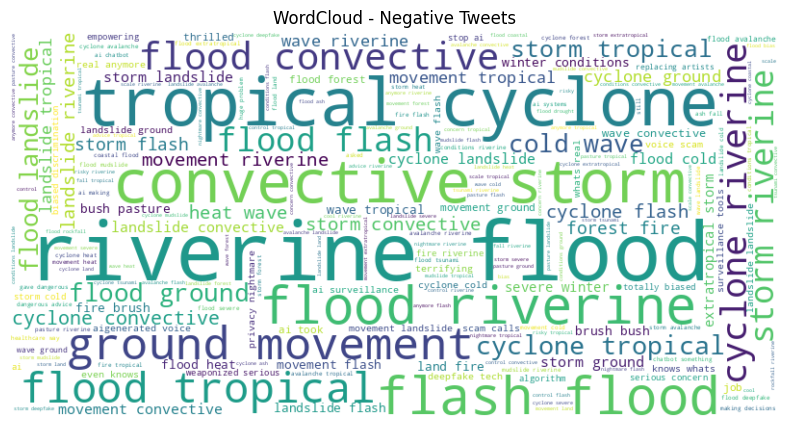

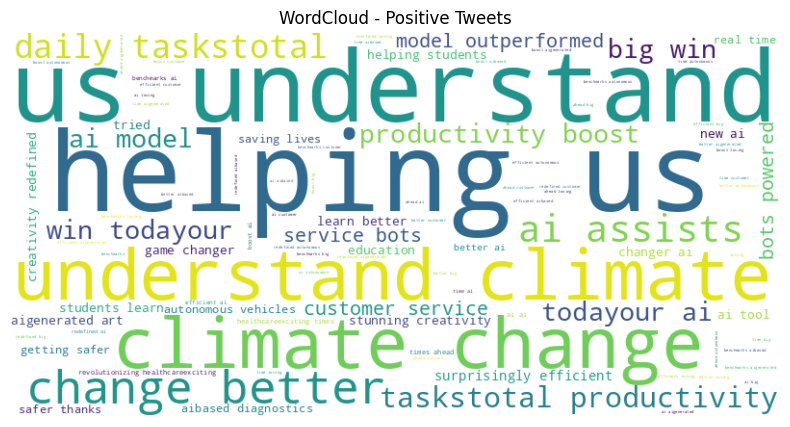

In [11]:


# Load the balanced dataset
df = pd.read_csv("/content/balanced_sentiment_data.csv", parse_dates=['timestamp'])

# --- 1. Sentiment Distribution ---
fig1 = px.histogram(df, x="sentiment", color="sentiment", title="Sentiment Distribution (Balanced Dataset)", barmode="group")
fig1.show()

# --- 2. Word Frequency per Sentiment Class ---
def clean_text(text):
    text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)
    text = re.sub(r'\@\w+|\#','', text)
    return re.sub(r'[^\w\s]', '', text.lower())

df['clean_text'] = df['text'].astype(str).apply(clean_text)

def get_top_words(df, sentiment, n=10):
    text = " ".join(df[df['sentiment'] == sentiment]['clean_text'].values)
    words = text.split()
    common_words = Counter(words).most_common(n)
    return pd.DataFrame(common_words, columns=['word', 'count'])

for sentiment in df['sentiment'].unique():
    top_words_df = get_top_words(df, sentiment)
    fig = px.bar(top_words_df, x='word', y='count', title=f"Top Words in {sentiment.capitalize()} Tweets")
    fig.show()

# --- 3. WordClouds per Sentiment ---
for sentiment in df['sentiment'].unique():
    text = " ".join(df[df['sentiment'] == sentiment]['clean_text'].values)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"WordCloud - {sentiment.capitalize()} Tweets")
    plt.show()

# --- 4. Hashtag & Mention Analysis ---
df['hashtags'] = df['text'].apply(lambda x: re.findall(r"#(\w+)", str(x)))
df['mentions'] = df['text'].apply(lambda x: re.findall(r"@(\w+)", str(x)))

def flatten_and_count(list_series):
    return Counter([item for sublist in list_series for item in sublist])

for col, title in [('hashtags', 'Hashtag'), ('mentions', 'Mention')]:
    for sentiment in df['sentiment'].unique():
        filtered = df[df['sentiment'] == sentiment]
        counter = flatten_and_count(filtered[col])
        top_items = pd.DataFrame(counter.most_common(10), columns=[col, 'count'])
        fig = px.bar(top_items, x=col, y='count', title=f"Top {title}s in {sentiment.capitalize()} Tweets")
        fig.show()

# --- 5. Tweet Length Distribution ---
df['tweet_length'] = df['text'].astype(str).apply(len)
fig = px.histogram(df, x="tweet_length", color="sentiment", nbins=50, barmode="overlay",
                   title="Tweet Length Distribution by Sentiment")
fig.show()

# --- 6. Time-Series Volume of Tweets ---
df['date'] = df['timestamp'].dt.date
volume_df = df.groupby(['date', 'sentiment']).size().reset_index(name='count')
fig = px.line(volume_df, x='date', y='count', color='sentiment', title="Tweet Volume Over Time")
fig.show()

# --- 7. Sentiment Evolution Over Time ---
sentiment_avg = df.groupby(['date', 'sentiment']).size().unstack(fill_value=0)
sentiment_avg['total'] = sentiment_avg.sum(axis=1)
sentiment_evolution = (sentiment_avg.T / sentiment_avg['total']).T.drop(columns='total')
sentiment_evolution.reset_index(inplace=True)
fig = go.Figure()
for col in sentiment_evolution.columns[1:]:
    fig.add_trace(go.Scatter(x=sentiment_evolution['date'], y=sentiment_evolution[col], mode='lines', name=col))
fig.update_layout(title="Sentiment Evolution Over Time", xaxis_title="Date", yaxis_title="Proportion")
fig.show()


In [12]:
##======Time Series Analysis=======##

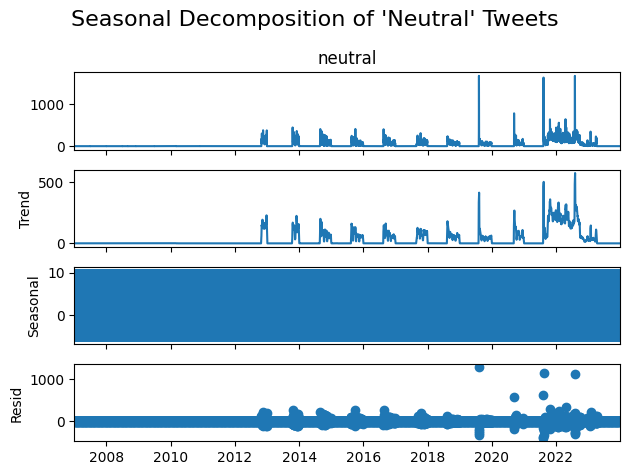


--- Augmented Dickey-Fuller Test: negative ---
ADF Statistic: -6.5480
p-value: 0.0000
Critical Value (1%): -3.4314
Critical Value (5%): -2.8620
Critical Value (10%): -2.5670
 Stationary (reject H0)

--- KPSS Test: negative ---
KPSS Statistic: 8.4786
p-value: 0.0100
Critical Value (10%): 0.3470
Critical Value (5%): 0.4630
Critical Value (2.5%): 0.5740
Critical Value (1%): 0.7390
 Non-stationary (reject H0)

--- Augmented Dickey-Fuller Test: neutral ---


<ipython-input-13-272cdbd14163>:40: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




ADF Statistic: -4.8124
p-value: 0.0001
Critical Value (1%): -3.4314
Critical Value (5%): -2.8620
Critical Value (10%): -2.5670
 Stationary (reject H0)

--- KPSS Test: neutral ---
KPSS Statistic: 2.8264
p-value: 0.0100
Critical Value (10%): 0.3470
Critical Value (5%): 0.4630
Critical Value (2.5%): 0.5740
Critical Value (1%): 0.7390
 Non-stationary (reject H0)

--- Augmented Dickey-Fuller Test: positive ---


<ipython-input-13-272cdbd14163>:40: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




ADF Statistic: -3.0645
p-value: 0.0293
Critical Value (1%): -3.4314
Critical Value (5%): -2.8620
Critical Value (10%): -2.5670
 Stationary (reject H0)

--- KPSS Test: positive ---
KPSS Statistic: 2.7968
p-value: 0.0100
Critical Value (10%): 0.3470
Critical Value (5%): 0.4630
Critical Value (2.5%): 0.5740
Critical Value (1%): 0.7390
 Non-stationary (reject H0)


<ipython-input-13-272cdbd14163>:40: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




In [13]:

# Load dataset
df = pd.read_csv("/content/balanced_sentiment_data.csv", parse_dates=["timestamp"])

# Step 1: Reindex to Daily Frequency
df['date'] = df['timestamp'].dt.date
daily_counts = df.groupby(['date', 'sentiment']).size().unstack(fill_value=0)
daily_counts.index = pd.to_datetime(daily_counts.index)
daily_counts = daily_counts.asfreq('D').fillna(0)  # Ensure consistent daily frequency

# Step 2: Plot Trend, Spikes, Seasonality
fig = px.line(daily_counts, title="Daily Tweet Volume by Sentiment")
fig.update_layout(xaxis_title="Date", yaxis_title="Tweet Count")
fig.show()

# Optional: Decompose seasonality (let's try for 'neutral' sentiment)
decomposition = sm.tsa.seasonal_decompose(daily_counts['neutral'], model='additive')
decomposition.plot()
plt.suptitle("Seasonal Decomposition of 'Neutral' Tweets", fontsize=16)
plt.tight_layout()
plt.show()

# Apply first-order differencing to all sentiment series
diff_df = daily_counts.diff().dropna()

# Step 3: ADF & KPSS Tests
def adf_test(series, title=''):
    print(f'\n--- Augmented Dickey-Fuller Test: {title} ---')
    result = adfuller(series.dropna(), autolag='AIC')
    print(f'ADF Statistic: {result[0]:.4f}')
    print(f'p-value: {result[1]:.4f}')
    for key, value in result[4].items():
        print(f'Critical Value ({key}): {value:.4f}')
    if result[1] <= 0.05:
        print(" Stationary (reject H0)")
    else:
        print(" Non-stationary (fail to reject H0)")

def kpss_test(series, title=''):
    print(f'\n--- KPSS Test: {title} ---')
    statistic, p_value, lags, critical_values = kpss(series.dropna(), regression='c')
    print(f'KPSS Statistic: {statistic:.4f}')
    print(f'p-value: {p_value:.4f}')
    for key, value in critical_values.items():
        print(f'Critical Value ({key}): {value:.4f}')
    if p_value <= 0.05:
        print(" Non-stationary (reject H0)")
    else:
        print(" Stationary (fail to reject H0)")

# Apply tests to each sentiment class
for sentiment in daily_counts.columns:
    adf_test(daily_counts[sentiment], title=sentiment)
    kpss_test(daily_counts[sentiment], title=sentiment)


In [14]:
print("=== Rechecking After First-Order Differencing ===")
for sentiment in diff_df.columns:
    adf_test(diff_df[sentiment], title=f"{sentiment} (1st Difference)")
    kpss_test(diff_df[sentiment], title=f"{sentiment} (1st Difference)")


=== Rechecking After First-Order Differencing ===

--- Augmented Dickey-Fuller Test: negative (1st Difference) ---
ADF Statistic: -23.1463
p-value: 0.0000
Critical Value (1%): -3.4314
Critical Value (5%): -2.8620
Critical Value (10%): -2.5670
 Stationary (reject H0)

--- KPSS Test: negative (1st Difference) ---
KPSS Statistic: 0.1060
p-value: 0.1000
Critical Value (10%): 0.3470
Critical Value (5%): 0.4630
Critical Value (2.5%): 0.5740
Critical Value (1%): 0.7390
 Stationary (fail to reject H0)

--- Augmented Dickey-Fuller Test: neutral (1st Difference) ---


<ipython-input-13-272cdbd14163>:40: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




ADF Statistic: -18.2447
p-value: 0.0000
Critical Value (1%): -3.4314
Critical Value (5%): -2.8620
Critical Value (10%): -2.5670
 Stationary (reject H0)

--- KPSS Test: neutral (1st Difference) ---
KPSS Statistic: 0.0186
p-value: 0.1000
Critical Value (10%): 0.3470
Critical Value (5%): 0.4630
Critical Value (2.5%): 0.5740
Critical Value (1%): 0.7390
 Stationary (fail to reject H0)

--- Augmented Dickey-Fuller Test: positive (1st Difference) ---


<ipython-input-13-272cdbd14163>:40: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




ADF Statistic: -21.6769
p-value: 0.0000
Critical Value (1%): -3.4314
Critical Value (5%): -2.8620
Critical Value (10%): -2.5670
 Stationary (reject H0)

--- KPSS Test: positive (1st Difference) ---
KPSS Statistic: 0.0018
p-value: 0.1000
Critical Value (10%): 0.3470
Critical Value (5%): 0.4630
Critical Value (2.5%): 0.5740
Critical Value (1%): 0.7390
 Stationary (fail to reject H0)


<ipython-input-13-272cdbd14163>:40: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




In [15]:
#=====MODEL BUILDING=====#

In [16]:
#SARIMA + VAR#

In [19]:
print(df.columns)


Index(['text', 'sentiment', 'hashtag_count', 'mention_count', 'tweet_length',
       'date'],
      dtype='object')


In [22]:
# Convert sentiment strings to numerical values
sentiment_mapping = {'positive': 1, 'neutral': 0, 'negative': -1}
df['sentiment_score'] = df['sentiment'].map(sentiment_mapping)

# Now resample using the numerical sentiment score
ts = df['sentiment_score'].resample('D').mean().fillna(method='ffill')


<ipython-input-22-690cd5093930>:6: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [25]:
# Print current columns
print("Current columns:", df.columns)

# Check for any column with datetime-like content
for col in df.columns:
    if pd.api.types.is_datetime64_any_dtype(df[col]) or df[col].astype(str).str.contains(r'\d{4}-\d{2}-\d{2}').any():
        print(f"Possible datetime column: {col}")


Current columns: Index(['text', 'sentiment', 'hashtag_count', 'mention_count', 'tweet_length',
       'sentiment_score'],
      dtype='object')
Possible datetime column: text


In [26]:
# Rename it to 'date' for consistency (if found)
df.rename(columns={'text': 'date'}, inplace=True)

# Convert it to datetime format
df['date'] = pd.to_datetime(df['date'], errors='coerce')

# Drop rows where datetime conversion failed
df = df.dropna(subset=['date'])

# Set as datetime index
df.set_index('date', inplace=True)

# Sanity check
print(df.index)


<ipython-input-26-de17024defb3>:5: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



DatetimeIndex([], dtype='datetime64[ns]', name='date', freq=None)


In [27]:
# Let's peek at the top few rows of each column
for col in df.columns:
    print(f"\nColumn: {col}")
    print(df[col].head(5))



Column: sentiment
Series([], Name: sentiment, dtype: object)

Column: hashtag_count
Series([], Name: hashtag_count, dtype: int64)

Column: mention_count
Series([], Name: mention_count, dtype: int64)

Column: tweet_length
Series([], Name: tweet_length, dtype: int64)

Column: sentiment_score
Series([], Name: sentiment_score, dtype: int64)


In [28]:
print("Initial DataFrame shape:", df.shape)


Initial DataFrame shape: (0, 5)


In [35]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima_model = SARIMAX(daily_df, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
sarima_result = sarima_model.fit(disp=False)

# Plot fitted vs actual
daily_df['sarima_pred'] = sarima_result.fittedvalues

# Residuals: What SARIMA couldn’t capture
daily_df['residuals'] = daily_df['sentiment_score'] - daily_df['sarima_pred']


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [36]:
#LSTM

In [38]:
#preparedata

In [37]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler

# Assume daily_df['residuals'] exists
residuals = daily_df['residuals'].fillna(0).values.reshape(-1, 1)

# Normalize residuals
scaler = MinMaxScaler(feature_range=(-1, 1))
residuals_scaled = scaler.fit_transform(residuals)

# Function to create sequences for LSTM
def create_sequences(data, window_size):
    sequences = []
    labels = []
    for i in range(len(data) - window_size):
        seq = data[i:i+window_size]
        label = data[i+window_size]
        sequences.append(seq)
        labels.append(label)
    return np.array(sequences), np.array(labels)

window_size = 14
X, y = create_sequences(residuals_scaled, window_size)

X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)

dataset = TensorDataset(X_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)


In [39]:
#Define LSTM Model
class ResidualLSTM(nn.Module):
    def __init__(self, input_size=1, hidden_size=64, num_layers=2):
        super(ResidualLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.linear(out[:, -1, :])  # Take output of last time step
        return out

model = ResidualLSTM()
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


In [40]:
#train
num_epochs = 50
for epoch in range(num_epochs):
    for X_batch, y_batch in dataloader:
        y_pred = model(X_batch)
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    if epoch % 10 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")


Epoch 0, Loss: 0.0866
Epoch 10, Loss: 0.0706
Epoch 20, Loss: 0.0457
Epoch 30, Loss: 0.0584
Epoch 40, Loss: 0.0515


In [41]:
model.eval()
X_input = torch.tensor(X, dtype=torch.float32)
with torch.no_grad():
    predictions = model(X_input).numpy()

# Reverse scale
predicted_residuals = scaler.inverse_transform(predictions)


In [42]:
sarima_pred_trimmed = daily_df['sarima_pred'].iloc[window_size:].values.reshape(-1, 1)
hybrid_pred = sarima_pred_trimmed + predicted_residuals  # You can apply weights too

# Optional weighted fusion
# hybrid_pred = 0.6 * sarima_pred_trimmed + 0.4 * predicted_residuals


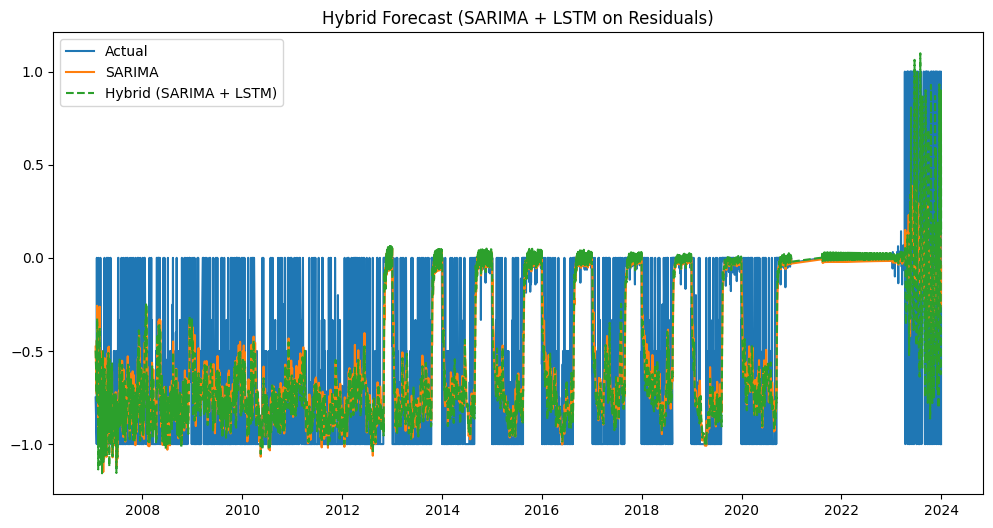

In [43]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(daily_df.index[window_size:], daily_df['sentiment_score'].iloc[window_size:], label='Actual')
plt.plot(daily_df.index[window_size:], sarima_pred_trimmed, label='SARIMA')
plt.plot(daily_df.index[window_size:], hybrid_pred, label='Hybrid (SARIMA + LSTM)', linestyle='--')
plt.legend()
plt.title("Hybrid Forecast (SARIMA + LSTM on Residuals)")
plt.show()
